# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3 as sq
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from nltk.stem import SnowballStemmer
from sklearn.preprocessing import StandardScaler,MaxAbsScaler
from wordcloud import WordCloud,STOPWORDS
from prettytable import PrettyTable

C:\ProgramData\Anaconda3\lib\site-packages\gensim\utils.py:1212: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [2]:
# using SQLite Table to read data.
con = sq.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 """, con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


1    307061
0     57110
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [20]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [21]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [22]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [23]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [24]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it, it would poison them. Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut, facts though say otherwise. Until the late 70 is it was poisonous until they figured out a way to fix that. I still like it but it could be better.


In [25]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [26]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Great ingredients although chicken should have been 1st rather than chicken broth the only thing I do not think belongs in it is Canola oil Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it it would poison them Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut facts though say otherwise Until the late 70 is it was poisonous until they figured out a way to fix that I still like it but it could be better 


In [27]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [28]:
# Combining all the above pre - processing steps 
from tqdm import tqdm
preprocessed_reviews = []
snowBall = SnowballStemmer('english')
# tqdm is for printing the status bar
for sentence in tqdm(final['Text'].values,position= 0,mininterval= 1):
    sentence = re.sub(r"http\S+", "", sentence)
    sentence = BeautifulSoup(sentence, 'lxml').get_text()
    sentence = decontracted(sentence)
    sentence = re.sub("\S*\d\S*", "", sentence).strip()
    sentence = re.sub('[^A-Za-z]+', ' ', sentence)
    sentence = ' '.join(snowBall.stem(words) for words in sentence.split())
    # https://gist.github.com/sebleier/554280
    sentence = ' '.join(e.lower() for e in sentence.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentence.strip())

100%|█████████████████████████████████████████████████████████████████████████| 364171/364171 [06:59<00:00, 867.34it/s]


In [29]:
preprocessed_reviews[1500]

'great ingredi although chicken rather chicken broth onli thing not think belong canola oil canola rapese not somet dog would ever find natur find rapese natur eat would poison today food industri convinc mass canola oil safe even better oil oliv virgin coconut fact though say otherwis late poison figur way fix still like could better'

In [30]:
#Storing the review text and summary with preprocessed values
#final['Text'] = preprocessed_reviews
#final['Summary'] = preprocessed_summary

#Storing the preprocessed dataframe on HDD
#conn = sq.connect('AmazonReviewFiltered.sqlite')
#final.to_sql('Reviews', conn,if_exists= 'replace' )

conn = sq.connect('AmazonReviewFiltered.sqlite')
AmazonReviewDataFiltered = pd.read_sql_query("""SELECT * FROM Reviews """, conn)

AmazonReviewDataFiltered.head()

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,1,939340800,EVERY book is educational,witti littl book make son laugh loud recit car...
1,138688,150506,0006641040,A2IW4PEEKO2R0U,Tracy,1,1,1,1194739200,"Love the book, miss the hard cover version",grew read sendak book watch realli rosi movi i...
2,138689,150507,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,1,1191456000,chicken soup with rice months,fun way children learn month year learn poem t...
3,138690,150508,0006641040,AZGXZ2UUK6X,"Catherine Hallberg ""(Kate)""",1,1,1,1076025600,a good swingy rhythm for reading aloud,great littl book read aloud nice rhythm well g...
4,138691,150509,0006641040,A3CMRKGE0P909G,Teresa,3,4,1,1018396800,A great way to learn the months,book poetri month year goe month cute littl po...


In [31]:
AmazonReviewDataFiltered['Score'].value_counts()

1    307061
0     57110
Name: Score, dtype: int64

In [32]:
# Sampling 100k data points from AmazonREviewDataFiltered to perform BoW, TF - IDF, word2vec and TF - IDF avgerage w2v, to reduce processing time.
AmazonPositiveReviewData = AmazonReviewDataFiltered[AmazonReviewDataFiltered['Score'] == 1].sample(n =42150) # Sampling 84300 positive data points from AmazonReviewDataFiltered, i.e. 84.3%
AmazonNegativeReviewData = AmazonReviewDataFiltered[AmazonReviewDataFiltered['Score'] == 0].sample(n = 7850) # Sampling 15700 negative data points from AmazonReviewDataFiltered, i.e. 15.7%
AmazonReviewDataSampled = AmazonPositiveReviewData.append(AmazonNegativeReviewData, ignore_index= True) # Appending the samples of positive and negative data points to form AmazonReviewDataSampled 
AmazonReviewDataSampled.head(4)

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,516200,558098,B0015RWSIE,A2BE9ZKWRMIM30,hrrmph,1,1,1,1296691200,Good,regular dri blackberri look freez dri use cere...
1,419015,453117,B0029XLH4Y,A7QM67PEMWPYI,"Amazoniansince95 ""Skippy""",0,0,1,1348185600,Hard to drink anything else.,prefer strong coffe tri onli k cup strong grea...
2,295241,319820,B002GWH87I,A1VQBEW0G4IH1J,L. Knights,4,6,1,1277251200,Hibiscus oolong iced tea - yum!,boyfriend like go fanci tea tast bar berkeley ...
3,123313,133737,B0029NJ4J4,ANJNZ364VY93M,Amber,0,0,1,1345593600,Convient food for my dog,initi purchas item dog bit nervous given food ...


In [33]:
AmazonReviewDataSampled.tail(4)

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
49996,375379,405903,B000CMFLPU,ASBWHWP7SV6SF,Dawnna,0,0,0,1312243200,They Lie about Protein Content!,genisoy flat lie descript advertis bar contain...
49997,79062,85967,B000CMKPDI,A2CRWK6QTUBXSE,S. Schmitt,9,9,0,1221436800,"OK, but not quite up to product claims",spray doe least partial freez poop canin owner...
49998,404390,437283,B0049ZA91W,A3N0KLIC0OXEX7,camgira,0,0,0,1346630400,This product has changed!,famili enthusiast consum granola year even swi...
49999,235517,255504,B003IDLLW2,A2B3VDIQOEYD9K,"Tara L. Fredette ""artnmuzic""",1,1,0,1340755200,Frequent rotten eggs,order dozen onli went dozen half befor give th...


In [34]:
AmazonReviewDataSampled['Score'].value_counts()

1    42150
0     7850
Name: Score, dtype: int64

In [35]:
conn = sq.connect('AmazonReviewDataSampled.sqlite')
AmazonReviewDataSampled.to_sql('Reviews', conn,if_exists= 'replace' )

In [6]:
con = sq.connect('AmazonReviewDataSampled.sqlite')
AmazonReviewDataSampled = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 """, con)

In [7]:
AmazonReviewDataSampled['Score'].value_counts()

1    42150
0     7850
Name: Score, dtype: int64

# [4] Featurization

## [4.1] BAG OF WORDS

In [26]:
#BoW
#Performing Bag of words vectorizer using sklearn inbuit function countvectorizer for train and test data for review text
bagofwords = CountVectorizer() #in scikit-learn
bagofwords.fit(AmazonReviewDataSampled['Text'])
print("some feature names ", bagofwords.get_feature_names()[:10])
print('='*117)


bow = bagofwords.transform(AmazonReviewDataSampled['Text'])
print("the type of count vectorizer ",type(bow))
print("the shape of our text BOW Train vectorizer ",bow.get_shape())
print("the number of unique words ", bow.get_shape()[1])
print("*"*117)


some feature names  ['aa', 'aaa', 'aaaa', 'aaaaa', 'aaaah', 'aaaahhhhhh', 'aaaarrrrghh', 'aaagh', 'aaah', 'aaf']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of our text BOW Train vectorizer  (50000, 30364)
the number of unique words  30364
*********************************************************************************************************************


In [27]:
#Standardizing the bag of word vectorizer using Max Absolute scaler since bag of words vectorizer is a CSR matrix
maxscaler = MaxAbsScaler()
bow = maxscaler.fit_transform(bow)


## [4.2] Bi-Grams and n-Grams.

In [28]:
#bi-gram, tri-gram and n-gram

#removing stop words like "not" should be avoided before building n-grams
# count_vect = CountVectorizer(ngram_range=(1,2))
# please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# you can choose these numbers min_df=10, max_features=5000, of your choice
count_vect = CountVectorizer(ngram_range=(1,2), min_df=10, max_features=5000)
final_bigram_counts = count_vect.fit_transform(AmazonReviewDataSampled['Text'])
print("the type of count vectorizer ",type(final_bigram_counts))
print("the shape of out text BOW vectorizer ",final_bigram_counts.get_shape())
print("the number of unique words including both unigrams and bigrams ", final_bigram_counts.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (50000, 5000)
the number of unique words including both unigrams and bigrams  5000


## [4.3] TF-IDF

In [29]:
#Performing TFIDF vectorizer for train and test data using text review
tfidfVec = TfidfVectorizer(ngram_range=(1,2), min_df=10)
tfidfVec.fit(AmazonReviewDataSampled['Text'])
print("some sample features(unique words in the corpus)",tfidfVec.get_feature_names()[0:10])
print('='*117)

tfidf = tfidfVec.transform(AmazonReviewDataSampled['Text'])
print("the type of count vectorizer ",type(tfidf))
print("the shape of out text TFIDF Train vectorizer ",tfidf.get_shape())
print("the number of unique words including both unigrams and bigrams ", tfidf.get_shape()[1])
print('*'*117)


some sample features(unique words in the corpus) ['abandon', 'abil', 'abl', 'abl buy', 'abl chew', 'abl drink', 'abl eat', 'abl enjoy', 'abl find', 'abl finish']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF Train vectorizer  (50000, 31322)
the number of unique words including both unigrams and bigrams  31322
*********************************************************************************************************************


In [30]:
#Column standardization
maxscaler = MaxAbsScaler()
tfidf = maxscaler.fit_transform(tfidf)


## [4.4] Word2Vec

In [8]:
# Train your own Word2Vec model using your own text corpus
i=0
list_of_sentance=[]
for sentance in AmazonReviewDataSampled['Text']:
    list_of_sentance.append(sentance.split())

In [9]:
# Using Google News Word2Vectors

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.


# http://kavita-ganesan.com/gensim-word2vec-tutorial-starter-code/#.W17SRFAzZPY
# you can comment this whole cell
# or change these varible according to your need

is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
    print(w2v_model.wv.most_similar('great'))
    print('='*117)
    print(w2v_model.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

[('wonder', 0.7842409610748291), ('good', 0.7703503370285034), ('excel', 0.7699926495552063), ('awesom', 0.7484575510025024), ('perfect', 0.7461452484130859), ('fantast', 0.7387261390686035), ('amaz', 0.7041165828704834), ('terrif', 0.7014210224151611), ('nice', 0.6648892164230347), ('decent', 0.6372395753860474)]
[('best', 0.7928729057312012), ('greatest', 0.7375911474227905), ('tastiest', 0.7308129668235779), ('disgust', 0.6594317555427551), ('smoothest', 0.6487722992897034), ('nastiest', 0.6322851181030273), ('closest', 0.607459306716919), ('ive', 0.5759007930755615), ('saltiest', 0.5726813077926636), ('superior', 0.562412679195404)]


In [10]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  9566
sample words  ['chock', 'full', 'nut', 'veri', 'good', 'coffe', 'howev', 'bought', 'origin', 'think', 'new', 'york', 'roast', 'would', 'even', 'better', 'robust', 'richer', 'tast', 'love', 'get', 'freezer', 'need', 'smooth', 'rich', 'french', 'vanilla', 'favorit', 'hazelnut', 'also', 'delici', 'strawberri', 'licoric', 'wheel', 'great', 'not', 'confus', 'enjoy', 'much', 'youth', 'textur', 'complet', 'differ', 'one', 'rememb', 'made', 'flat', 'roll', 'small', 'jaw']


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v for Text review

In [34]:
# average Word2Vec
# compute average word2vec for each review.
avgW2V = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(AmazonReviewDataSampled['Text'].values): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent.split(): # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    avgW2V.append(sent_vec)
#print(len(avgW2VTrain))
print('The shape of avgerage word to vector for Train data  is ','(',len(avgW2V),',',len(avgW2V[0]),')')
#column standzrdization
scale = StandardScaler()
avgW2V = scale.fit_transform(avgW2V)

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [00:53<00:00, 931.77it/s]


The shape of avgerage word to vector for Train data  is  ( 50000 , 50 )


#### [4.4.1.2] TFIDF weighted W2v for text review


In [11]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(AmazonReviewDataSampled['Text'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [36]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidfw2v = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(AmazonReviewDataSampled['Text'], mininterval= 1): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent.split(): # for each word in a review/sentence
        
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidfw2v.append(sent_vec)
    row += 1



100%|████████████████████████████████████████████████████████████████████████████| 50000/50000 [09:51<00:00, 84.57it/s]


In [37]:
#column standardization
scale = StandardScaler()
tfidfw2v = scale.fit_transform(tfidfw2v)


## [5.1] K-Means Clustering

In [50]:
def kcluster(x_train):
    """Function to perform Kmeans clustering on x_train"""
    num_clusters = [2,4,5,8,10] # number of clusters
    inertia = [] # to store inertia values
    #hyperparameter tunning to find the best number of clusters using inertia
    for num in num_clusters:
        clustering = KMeans(n_clusters= num,verbose= 0, n_jobs= -1,random_state= 0)# initialzing the kmeans clustering algorithm
        clustering.fit(x_train)
        inertia.append(clustering.inertia_ )
        print("For cluster = %r, inertia is = %r"%(num,clustering.inertia_ ))
    print(inertia)
    # to plot number of clusters v/s inertia
    plt.plot(num_clusters,inertia)
    plt.title('Plot of Number of clusters v/s Inertia')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.show()
    
    
def KmeansCluster(x_train, num_of_cluster,X = 'None',vectorizer = 'None'):
    """Function to perform Kmeans cluster and plot word cloud for each cluster
    Parameters:
    x_train : array-like or sparse matrix of shape = [n_samples, n_features], the training input samples
    
    num_of_cluster : number of cluster in clustering algorithm
    
    X =  array-like or sparse matrix of shape = [n_samples, n_features] Default = None. Required incase vectorizer in none, to plot word cloud for each cluster
    vectorizer : bag of words or TFIDF. Default = None.  
    
    """
    model = KMeans(n_clusters= num_of_cluster,verbose= 0, n_jobs= -1,random_state= 0)
    model.fit(x_train)
    sortedcentroids = model.cluster_centers_.argsort()[:,::-1] # sorting the cluster centroids
    word = [] # storing the words from each cluster for word cloud plotting
    # if vectorizer is present then get the get feature names from vectorizer for each cluster and store in word,
    # else obtain words for each cluster from each review belonging to that cluster
    if vectorizer != 'None':
        featureNames = vectorizer.get_feature_names()
        for i in range(num_of_cluster):
            sent = ' '
            for ind in sortedcentroids[i, :50]:
                sent += ' ' + featureNames[ind]
            word.append(sent)
    else:
        labels = model.labels_
        
        df = pd.DataFrame(data= X)
        df['labels'] = labels
        word = []
        for x in range(num_of_cluster):
            sent = ' '
            sent = sent.join(df[df.columns[0]][df['labels'] == x])
            word.append(sent)
    # To Plot word cloud for each review    
    for x in range(num_of_cluster):
        
        print("For cluster %r , the word cloud is as shown below"%x)
        print('-'*117)
        wordcloud_positive_words = WordCloud(width = 800, height = 800,background_color ='white',min_font_size = 10).generate(word[x]) 
        plt.figure(figsize = (8, 8), facecolor = None)
        plt.imshow(wordcloud_positive_words)
        plt.title("Word Cloud for cluster %r using Kmeans clustering"%x)
        plt.axis('off')
        plt.show()          
        print('='*117)
    

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

For cluster = 2, inertia is = 165735.01083991118
For cluster = 4, inertia is = 165338.80431907316
For cluster = 5, inertia is = 165247.71674947062
For cluster = 8, inertia is = 164844.53407133464
For cluster = 10, inertia is = 164581.73846722048
[165735.01083991118, 165338.80431907316, 165247.71674947062, 164844.53407133464, 164581.73846722048]


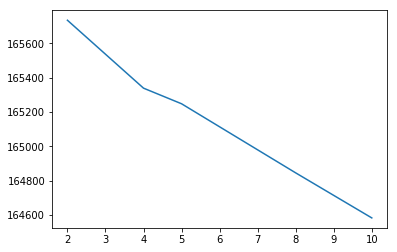

In [40]:
# hyperparameter tunning for kmeans clustering
kcluster(bow)

###### The optimal number of clusters is 10 

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


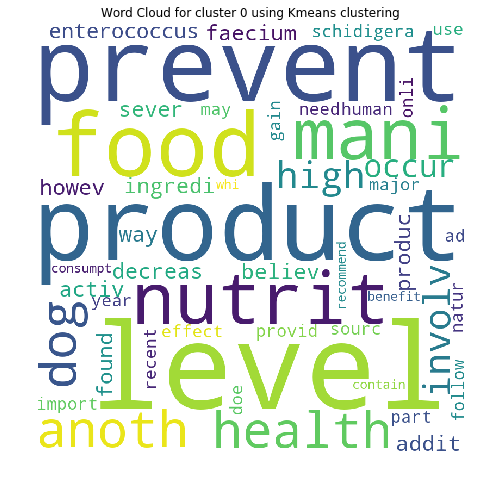

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


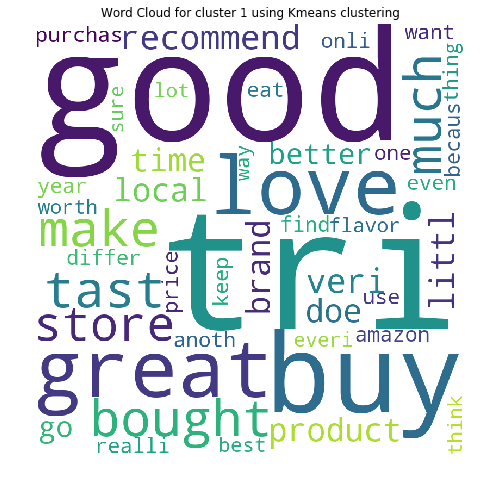

For cluster 2 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


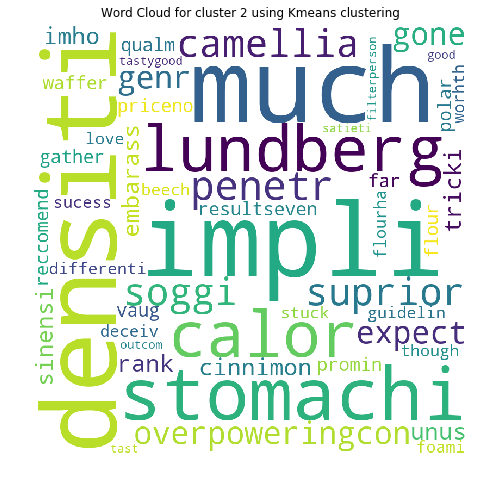

For cluster 3 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


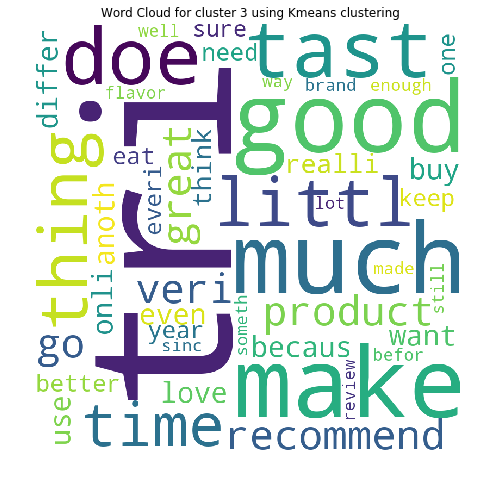

For cluster 4 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


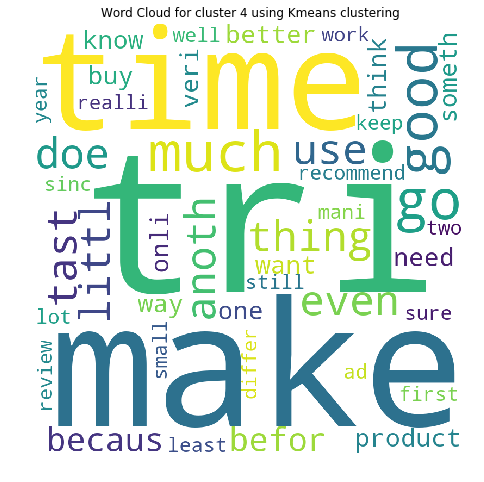

For cluster 5 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


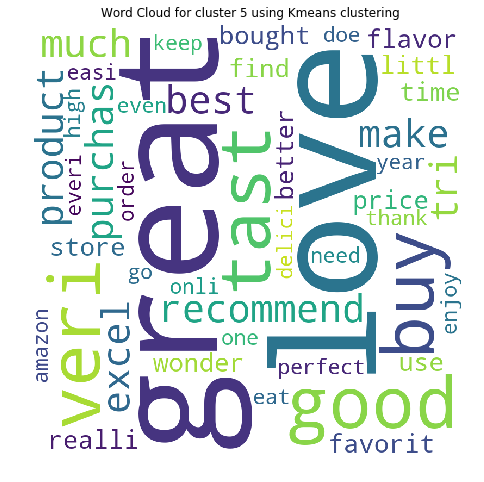

For cluster 6 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


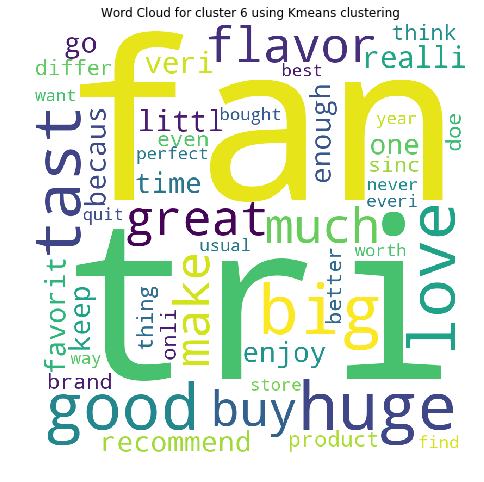

For cluster 7 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


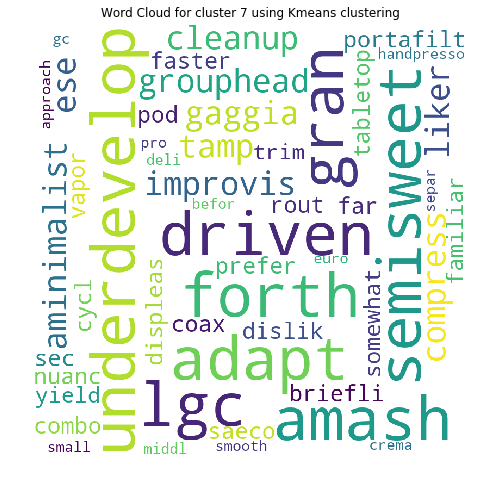

For cluster 8 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


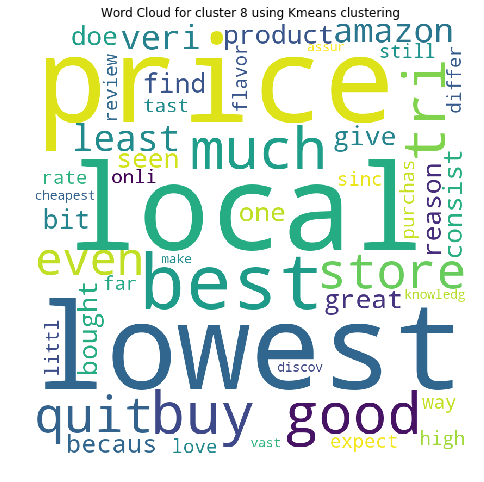

For cluster 9 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


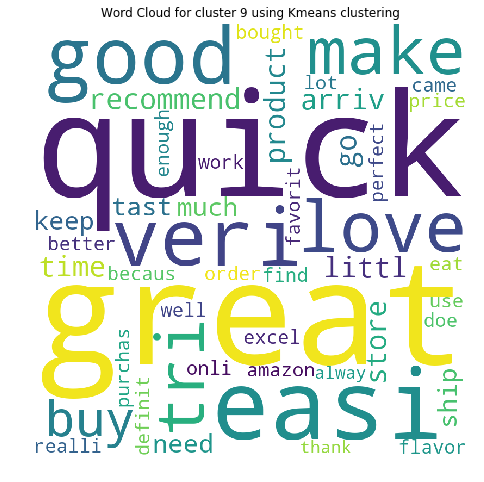

In [46]:
# To plot word cloud for each cluster
KmeansCluster(bow,10,vectorizer=bagofwords)

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

For cluster = 2, inertia is = 351715.88424507744
For cluster = 4, inertia is = 350854.61827578984
For cluster = 5, inertia is = 350194.44072939444
For cluster = 8, inertia is = 349492.25304726633
For cluster = 10, inertia is = 348688.1540416327
[351715.88424507744, 350854.61827578984, 350194.44072939444, 349492.25304726633, 348688.1540416327]


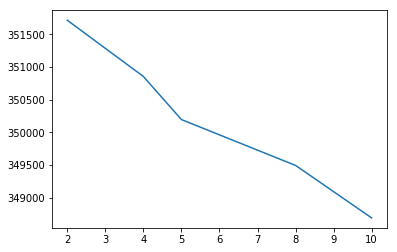

In [59]:
# hyperparameter tunning for kmeans
kcluster(tfidf)

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


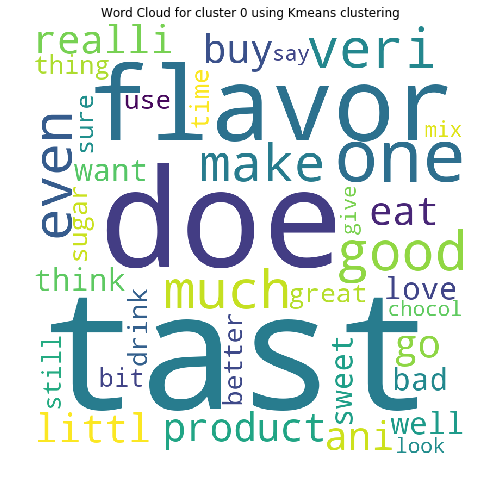

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


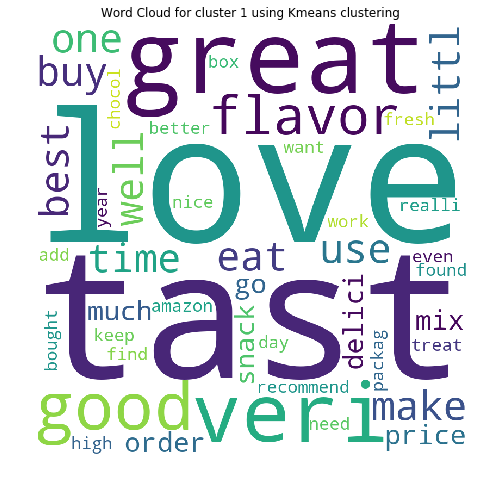

For cluster 2 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


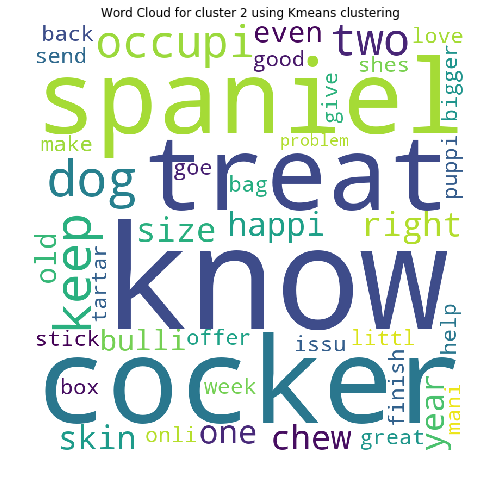

For cluster 3 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


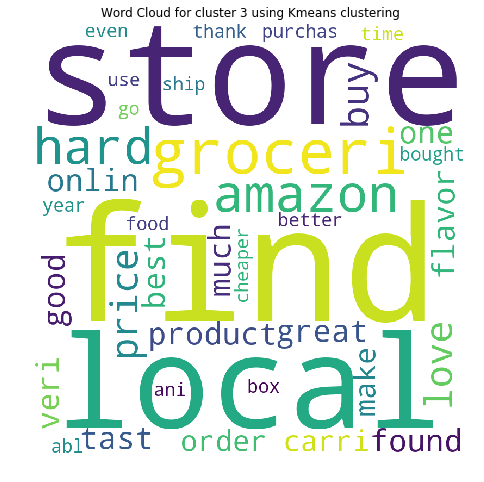

For cluster 4 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


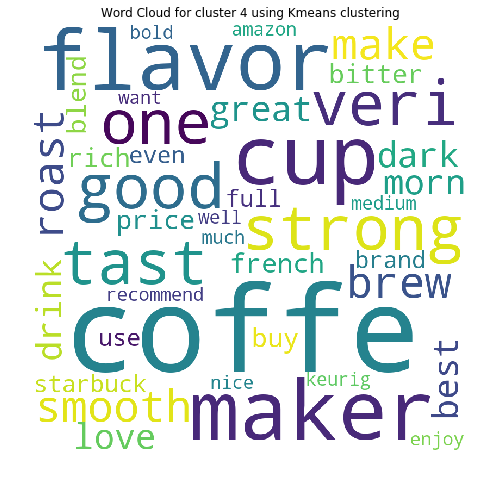

For cluster 5 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


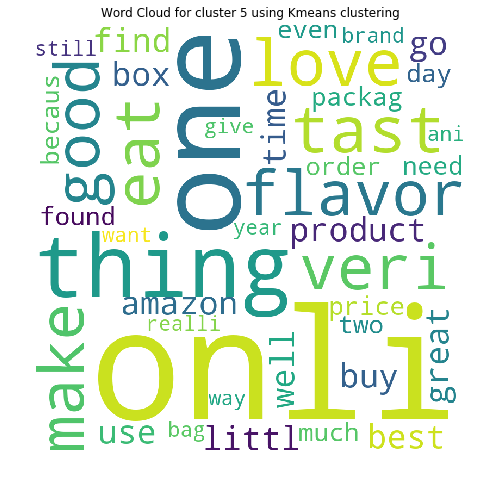

For cluster 6 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


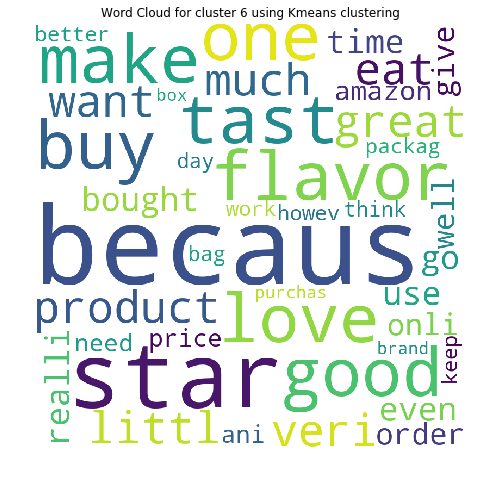

For cluster 7 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


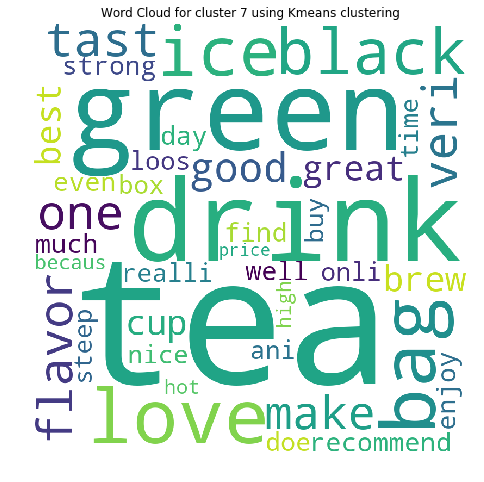

For cluster 8 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


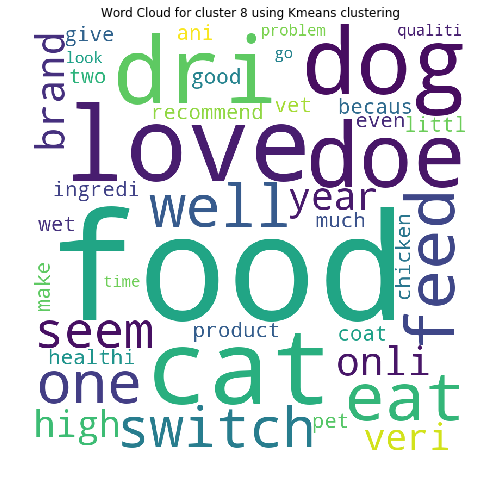

For cluster 9 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


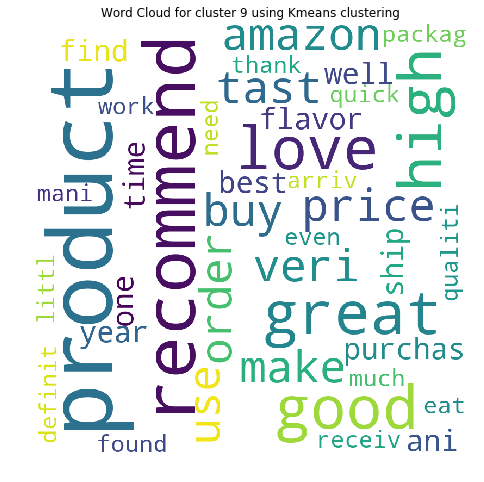

In [60]:
#TO plot word cloud for each cluster
KmeansCluster(tfidf,10,vectorizer=tfidfVec)

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

For cluster = 2, inertia is = 2267171.952786496
For cluster = 4, inertia is = 1976232.4596552053
For cluster = 5, inertia is = 1909488.6914477262
For cluster = 8, inertia is = 1763495.3886680254
For cluster = 10, inertia is = 1700208.0564702088
[2267171.952786496, 1976232.4596552053, 1909488.6914477262, 1763495.3886680254, 1700208.0564702088]


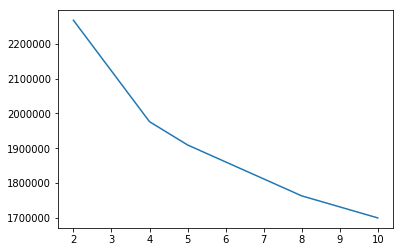

In [61]:
# hyperparameter tunning for each cluster
kcluster(avgW2V)

##### optimal number of clusters is 10

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


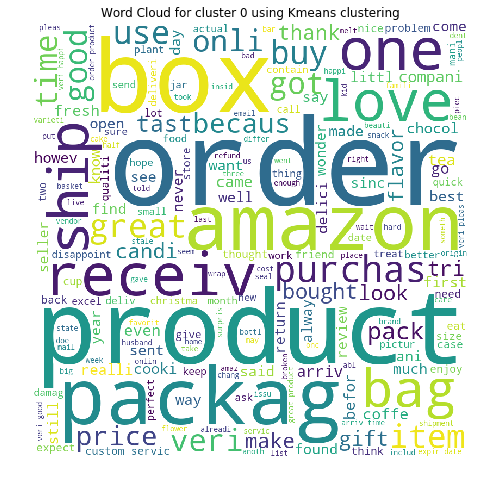

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


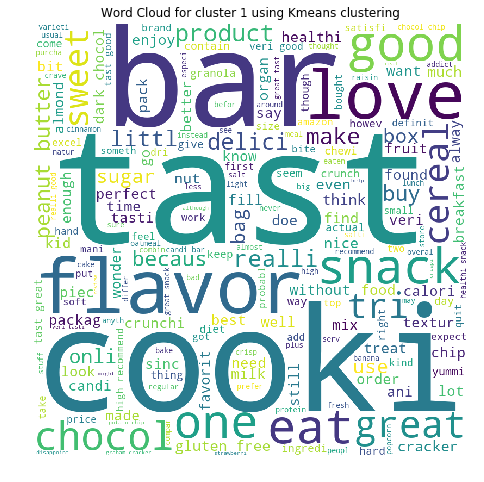

For cluster 2 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


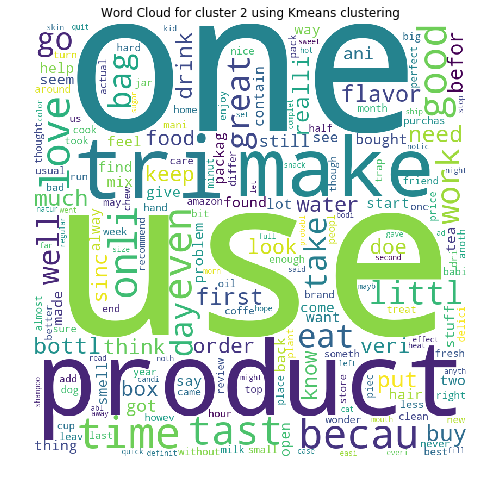

For cluster 3 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


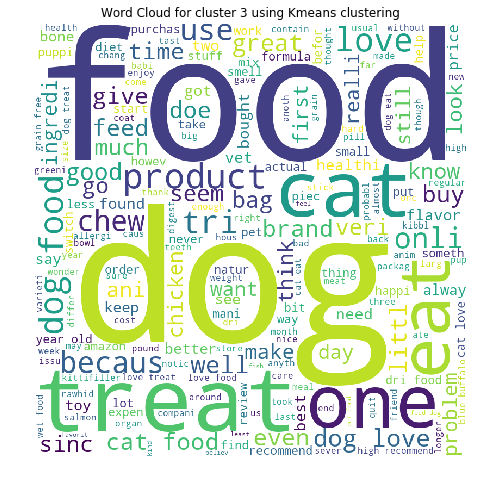

For cluster 4 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


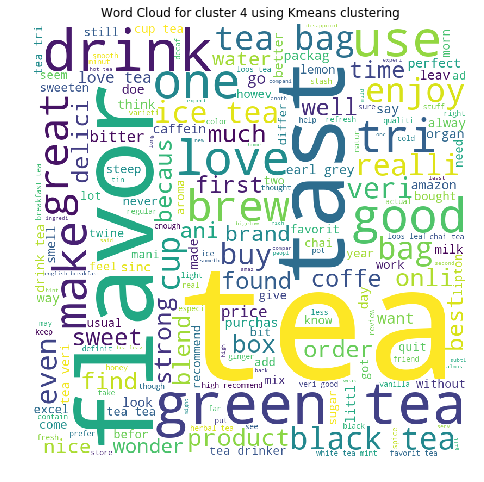

For cluster 5 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


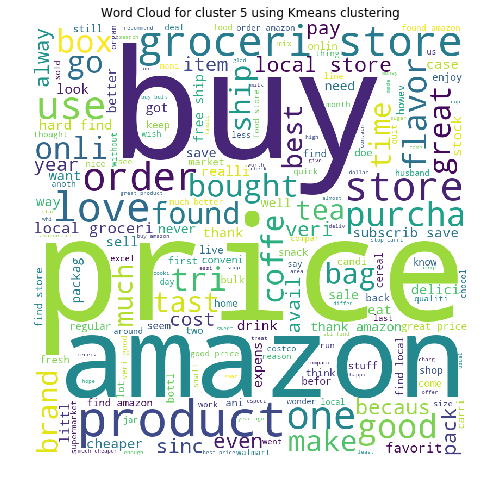

For cluster 6 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


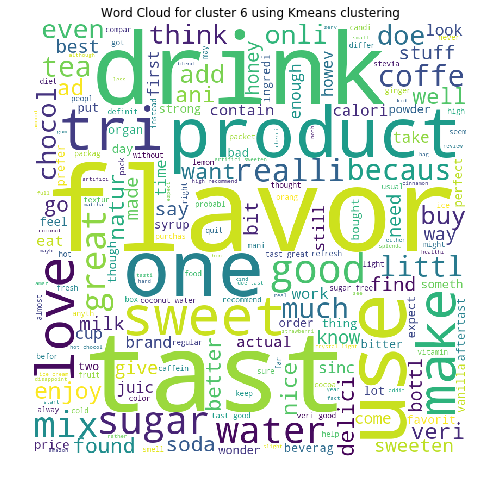

For cluster 7 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


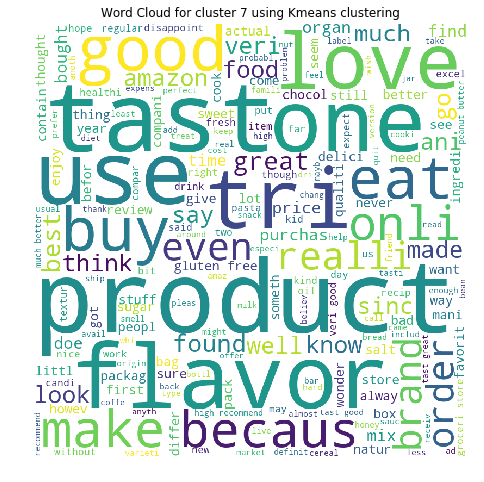

For cluster 8 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


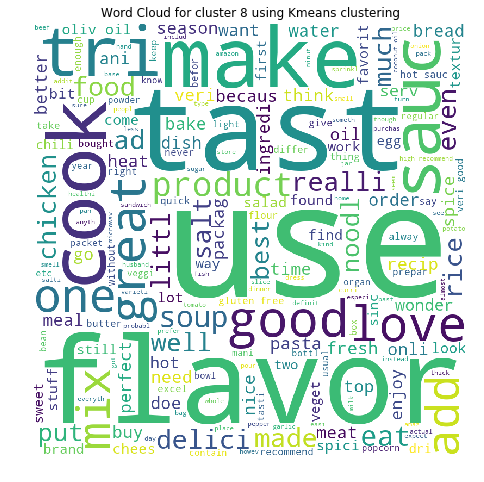

For cluster 9 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


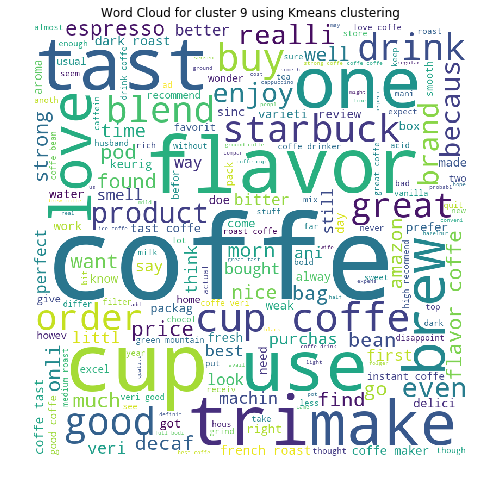

In [51]:
# To plot word cloud for each cluster
KmeansCluster(avgW2V,10,X = AmazonReviewDataSampled['Text'])

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

For cluster = 2, inertia is = 2262012.9218197637
For cluster = 4, inertia is = 1962602.007260314
For cluster = 5, inertia is = 1867272.885933759
For cluster = 8, inertia is = 1683264.9474147726
For cluster = 10, inertia is = 1618872.597939561
[2262012.9218197637, 1962602.007260314, 1867272.885933759, 1683264.9474147726, 1618872.597939561]


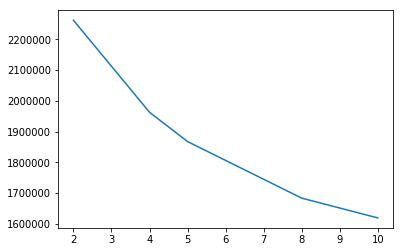

In [52]:
# hyperparameter tunning for kmeans
kcluster(tfidfw2v)

##### optimal number of clusters is 10

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


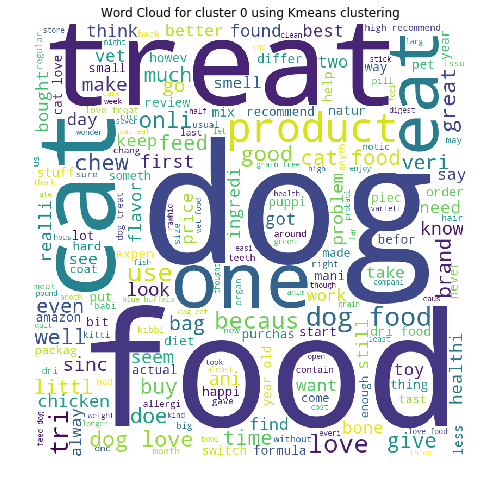

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


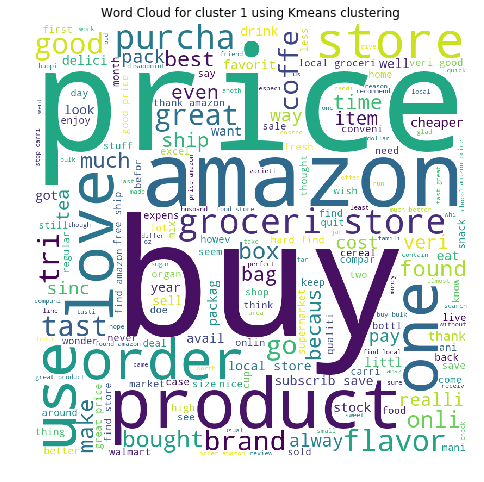

For cluster 2 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


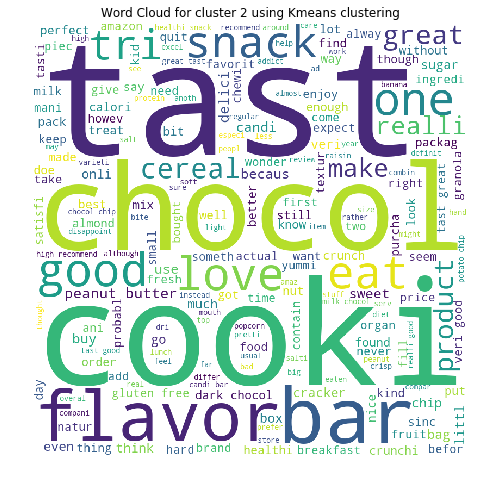

For cluster 3 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


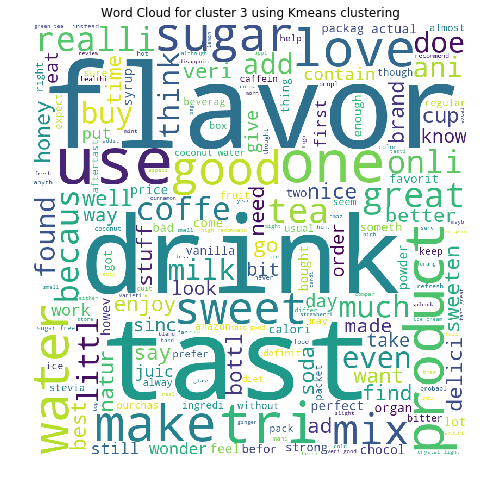

For cluster 4 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


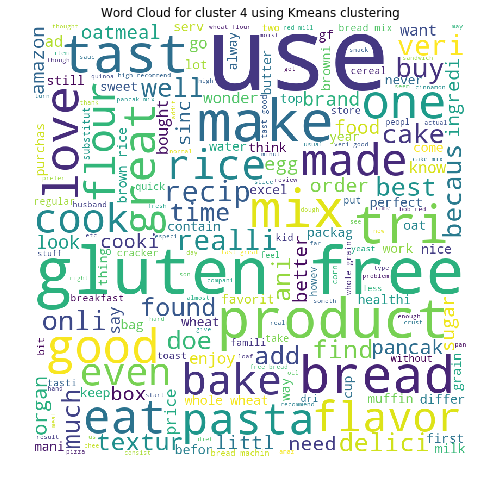

For cluster 5 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


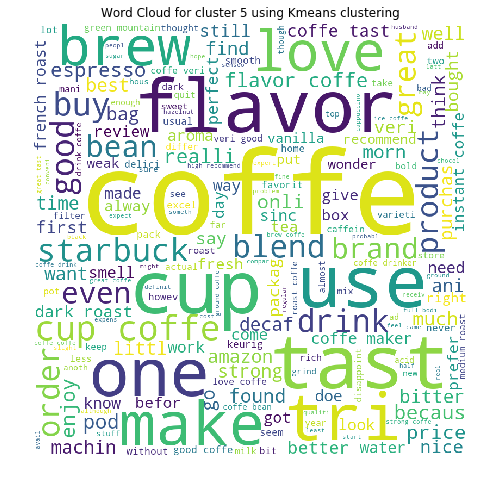

For cluster 6 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


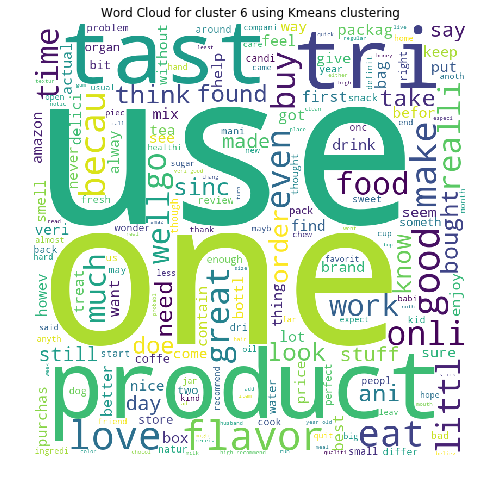

For cluster 7 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


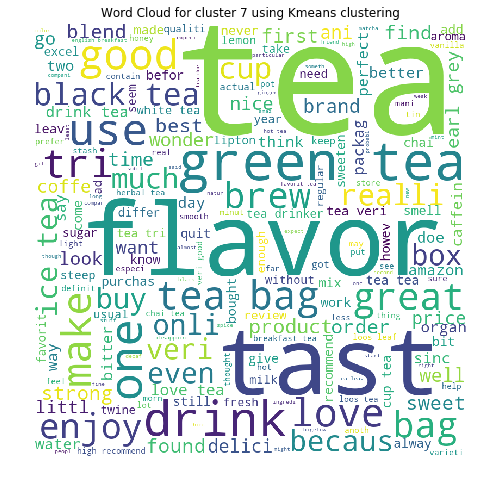

For cluster 8 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


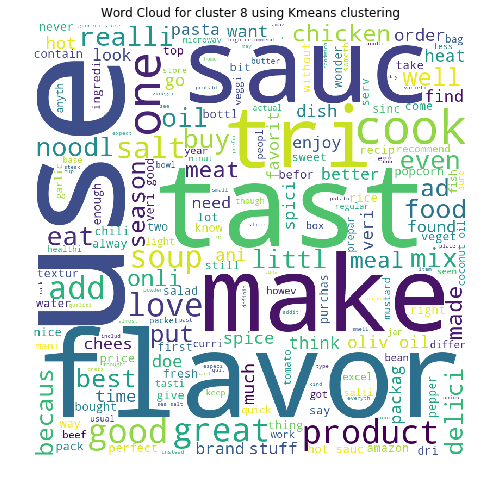

For cluster 9 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


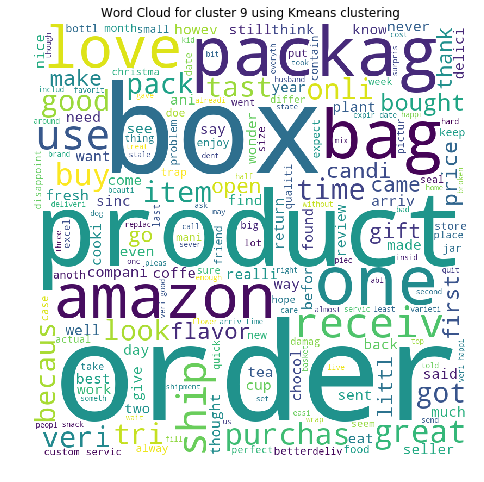

In [53]:
# To plot word cloud for each cluster
KmeansCluster(tfidfw2v,10,X = AmazonReviewDataSampled['Text'])

## [5.2] Agglomerative Clustering

##### Taking only 5000 reviews to perform Agglomerative Clustering and DBSCAN clustering

In [18]:
#Sampling Processed review to obtain 5000 samples
AmazonPositiveReviewData = AmazonReviewDataSampled[AmazonReviewDataSampled['Score'] == 1].sample(n =4215) # Sampling 4215 positive data points from AmazonReviewDataFiltered, i.e. 84.3%
AmazonNegativeReviewData = AmazonReviewDataSampled[AmazonReviewDataSampled['Score'] == 0].sample(n = 785) # Sampling 785 negative data points from AmazonReviewDataFiltered, i.e. 15.7%
AmazonReviewDataSampled = AmazonPositiveReviewData.append(AmazonNegativeReviewData, ignore_index= True) # Appending the samples of positive and negative data points to form AmazonReviewDataSampled 
AmazonReviewDataSampled.head(4)

,level_0,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,10607,192100,208277,B00008433V,A8327GB5QGPBN,Mercy May,1,1,1,1184976000,Good for the dog,dalmatian mix sever skin allergi food help red...
1,7308,79990,86971,B000LQJT5A,A3744AZ6HJNOMP,john,3,3,1,1291680000,love,eat noodl sinc mid eighti sad nong shim discon...
2,19227,8833,9675,B001LXYA5Q,A1VNOV3K0GS14L,Nikki Guerlain,2,2,1,1296518400,Neat stuff,chew ate chees hot sauc bunch citrus pretti ne...
3,2284,473957,512578,B002IYDXW8,A3CNZ6IFNZQFUG,OutOfTexas,0,0,1,1344297600,Great product,way cheaper infant formula toddler drink fine ...


In [24]:
# average Word2Vec
# compute average word2vec for each review.
avgW2V = []; # the avg-w2v for each sentence/review is stored in this list
for sent in AmazonReviewDataSampled['Text'].values: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent.split(): # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    avgW2V.append(sent_vec)
#print(len(avgW2VTrain))
print('The shape of avgerage word to vector for Train data  is ','(',len(avgW2V),',',len(avgW2V[0]),')')
#column standzrdization
scale = StandardScaler()
avgW2V = scale.fit_transform(avgW2V)

The shape of avgerage word to vector for Train data  is  ( 5000 , 50 )


In [25]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidfw2v = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in AmazonReviewDataSampled['Text']: # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent.split(): # for each word in a review/sentence
        
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidfw2v.append(sent_vec)
    row += 1



#column standardization
scale = StandardScaler()
tfidfw2v = scale.fit_transform(tfidfw2v)


In [26]:
def classifier (x_train,num_of_cluster, X):
    """Function to perform agglomerative clustering 
    x_train :  array-like or sparse matrix of shape = [n_samples, n_features], used for training
    num_of_cluster : Number of cluster for Agglomerative clustering
    X :  array-like or sparse matrix of shape = [n_samples, n_features]
    
    """
    # initializing Agglomerative clustering
    model = AgglomerativeClustering(n_clusters= num_of_cluster)
    model.fit(x_train) 
    labels = model.labels_ # obtaining the labels 
    df = pd.DataFrame(data = X) # dataframe 
    df['labels'] = labels # adding label to dataframe 
    word = [] # list to store words for word cloud
    # obtaining the words for each cluster
    for x in range(num_of_cluster):
        sent = ' '
        sent = sent.join(df[df.columns[0]][df['labels'] == x])
        word.append(sent)
    # To plot word cloud for each cluster    
    for x in range(num_of_cluster):
        
        print("For cluster %r , the word cloud is as shown below"%x)
        print('-'*117)
        wordcloud_positive_words = WordCloud(width = 800, height = 800,background_color ='white',min_font_size = 10).generate(word[x]) 
        plt.figure(figsize = (8, 8), facecolor = None)
        plt.imshow(wordcloud_positive_words)
        plt.title("Word Cloud for cluster %r using Agglomerative clustering"%x)
        plt.axis('off')
        plt.show()          
        print('='*117)

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


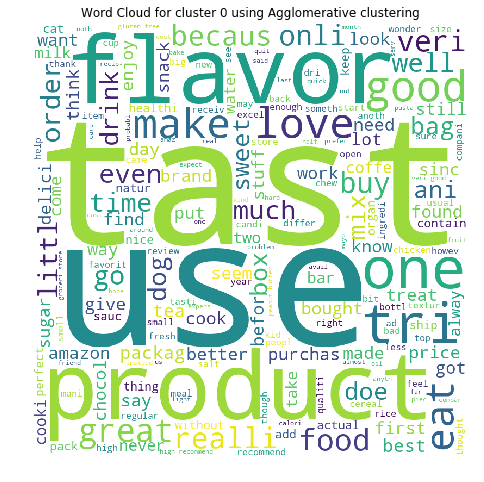

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


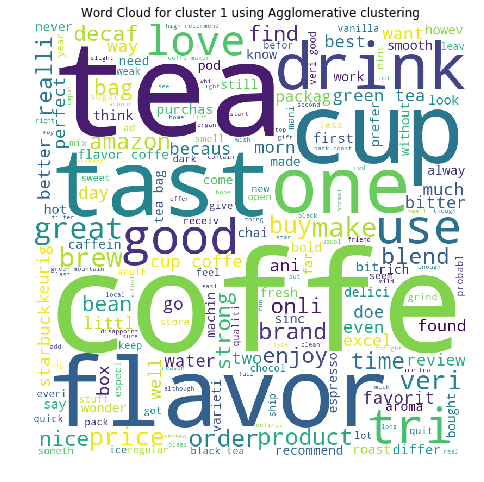

In [27]:
# Agglomerative clustering for number of cluster = 2
classifier(avgW2V,2,AmazonReviewDataSampled['Text'])

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


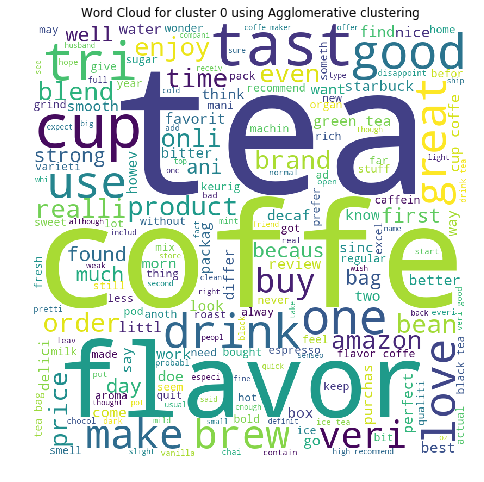

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


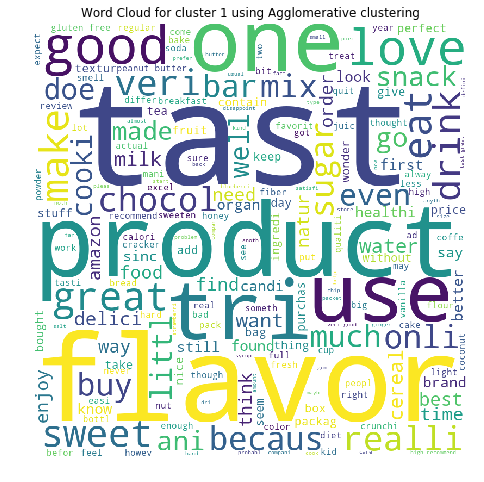

For cluster 2 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


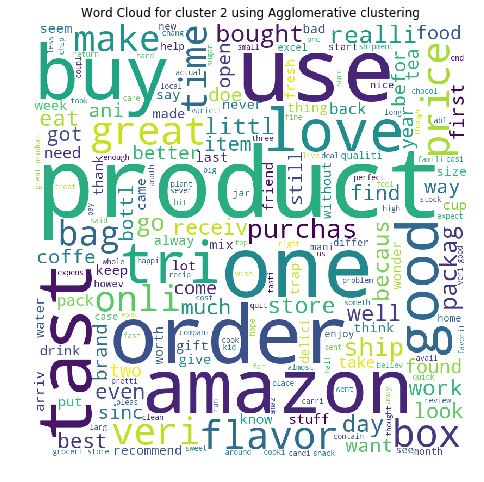

For cluster 3 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


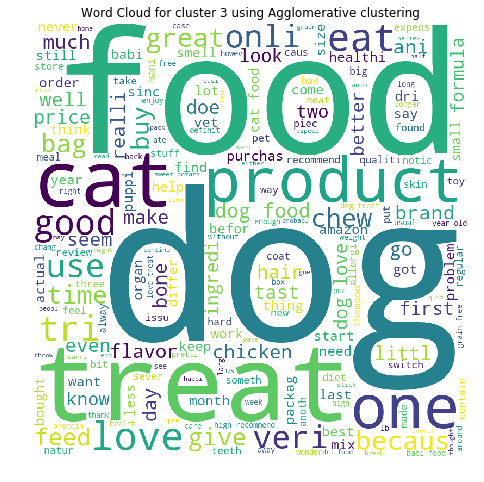

For cluster 4 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


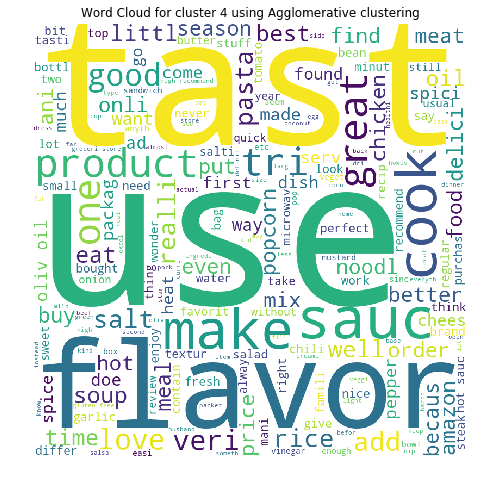

In [28]:
# Agglomerative clustering for number of cluster = 5
classifier(tfidfw2v,5,AmazonReviewDataSampled['Text'])

## [5.3] DBSCAN Clustering

In [149]:
def classifier(x_train,eps,X):
    """Function to perform DBSCAN clustering
    Parameters:
    
    x_train : array-like or sparse matrix of shape = [n_samples, n_features], used for training
    eps : The maximum distance between two samples for them to be considered as in the same neighborhood.
    X : array-like or sparse matrix of shape = [n_samples, n_features]
    """
    model = DBSCAN(eps = eps, n_jobs= -1,min_samples= 5,p = 2, algorithm= 'brute') # initializing DBSCAN model
    model.fit(x_train) # model fitting with train data
    labels = model.labels_
    print("Clusters obtained using DBSACN for eps = %r and minimum samples = 5 is " %eps,set(labels))
    print('-'*117)
    
    df = pd.DataFrame(data = X)
    df['labels'] = labels
    word = []
    #obtaining the words for each cluster for plotting in word cloud
    for x in set(labels):
        #print(x)
        sent = ' '
        sent = sent.join(df[df.columns[0]][df['labels'] == x])
        #print(sent)
        word.append(sent)
    for x in set(labels):
        
        
            #print(x)
            print("For cluster %r , the word cloud is as shown below"%x)
            print('-'*117)
            wordcloud_positive_words = WordCloud(width = 800, height = 800,background_color ='white',min_font_size = 10).generate(word[x]) 
            plt.figure(figsize = (8, 8), facecolor = None)
            plt.imshow(wordcloud_positive_words)
            plt.title("Word Cloud for cluster %r using DBSCAN clustering"%x)
            plt.axis('off')
            plt.show()          
            print('='*117)
       
        
    

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

Clusters obtained using DBSACN for eps = 4 and minimum samples = 5 is  {0, 1, -1}
---------------------------------------------------------------------------------------------------------------------
For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


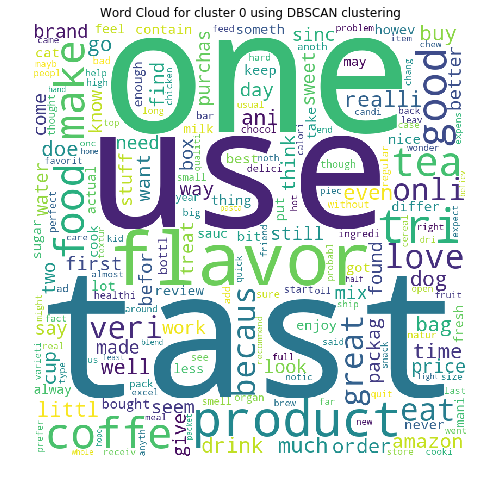

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


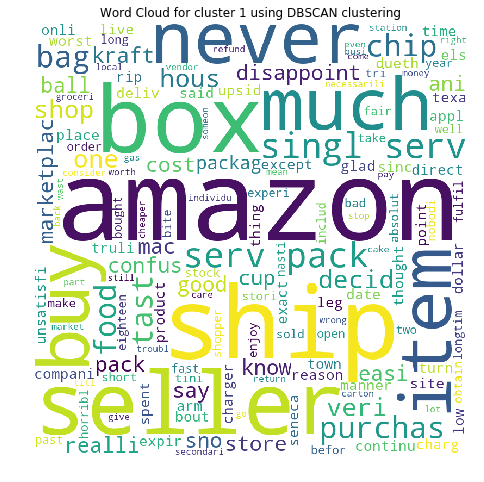

For cluster -1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


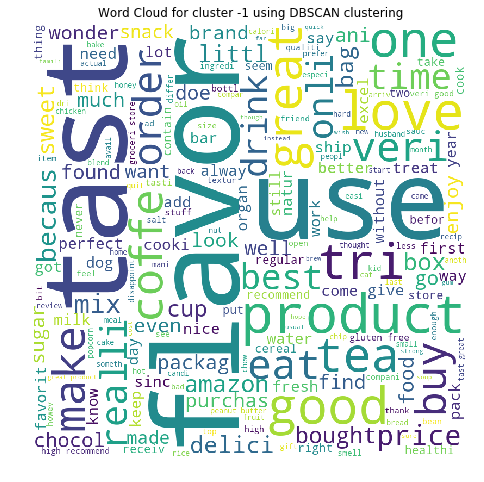

In [150]:
# DBSCAN clustering for eps = 4
classifier(avgW2V,4,AmazonReviewDataSampled['Text'])

Clusters obtained using DBSACN for eps = 6 and minimum samples = 5 is  {0, -1}
---------------------------------------------------------------------------------------------------------------------
For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


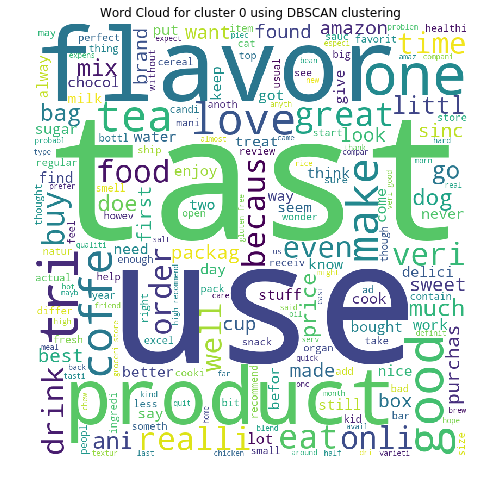

For cluster -1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


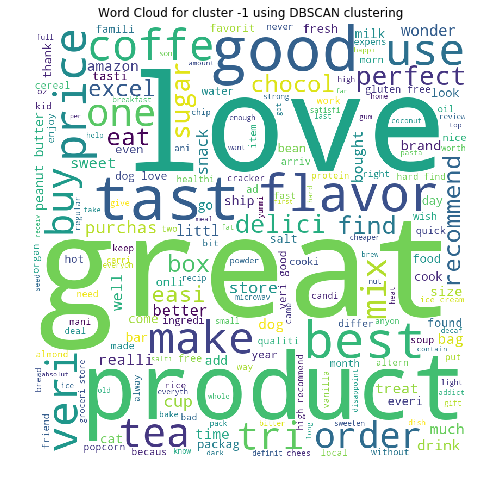

In [154]:
# DBSCAN clustering for eps = 6
classifier(avgW2V,6,AmazonReviewDataSampled['Text'])

Clusters obtained using DBSACN for eps = 8 and minimum samples = 5 is  {0, -1}
---------------------------------------------------------------------------------------------------------------------
For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


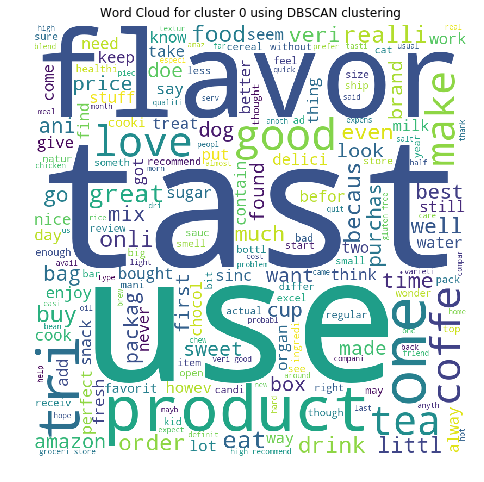

For cluster -1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


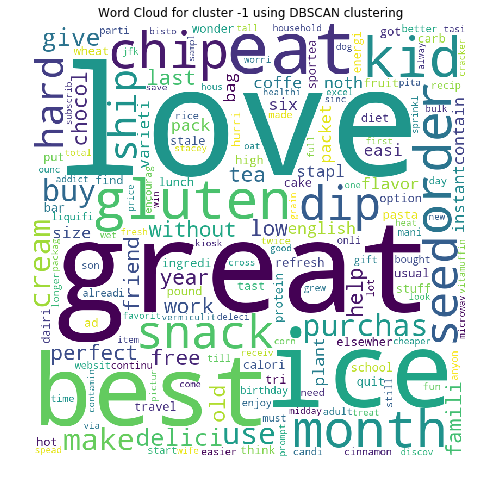

In [156]:
# DBSCAN clustering for eps = 8
classifier(avgW2V,8,AmazonReviewDataSampled['Text'])

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

Clusters obtained using DBSACN for eps = 4 and minimum samples = 5 is  {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, -1}
---------------------------------------------------------------------------------------------------------------------
For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


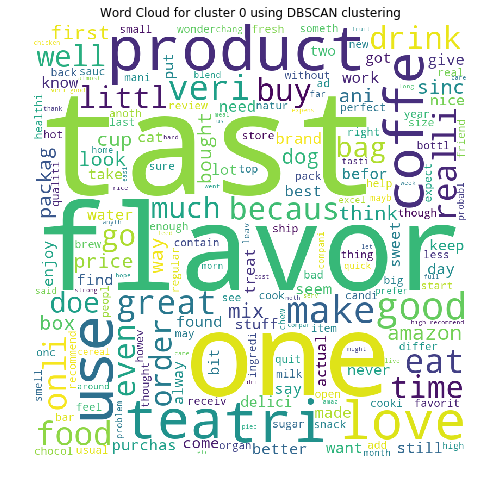

For cluster 1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


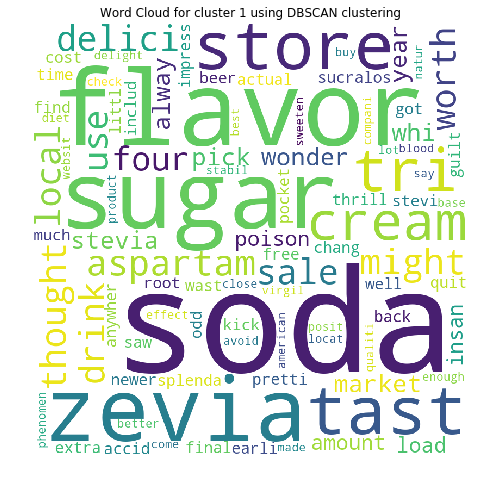

For cluster 2 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


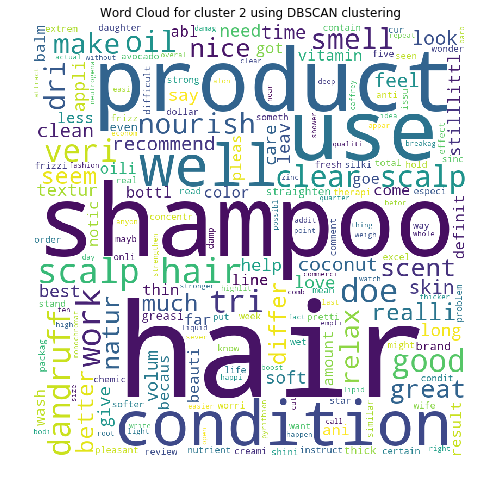

For cluster 3 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


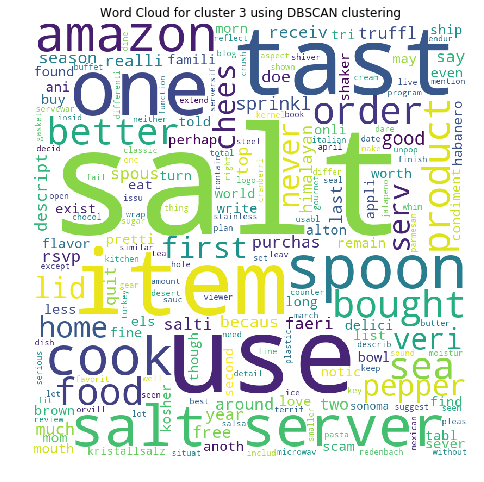

For cluster 4 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


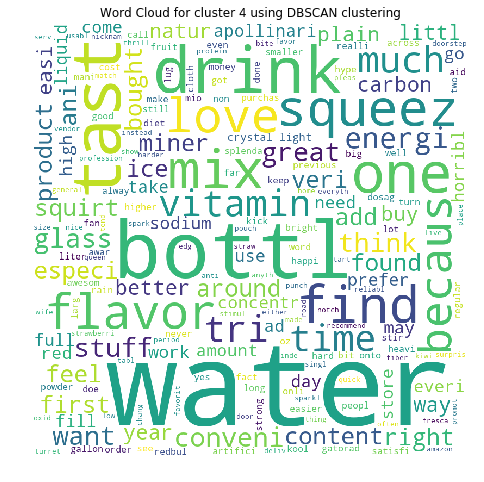

For cluster 5 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


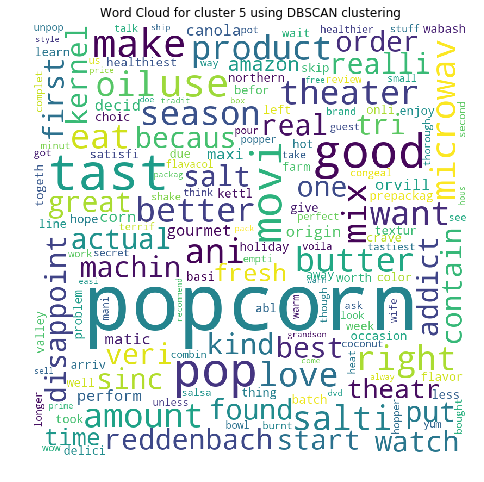

For cluster 6 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


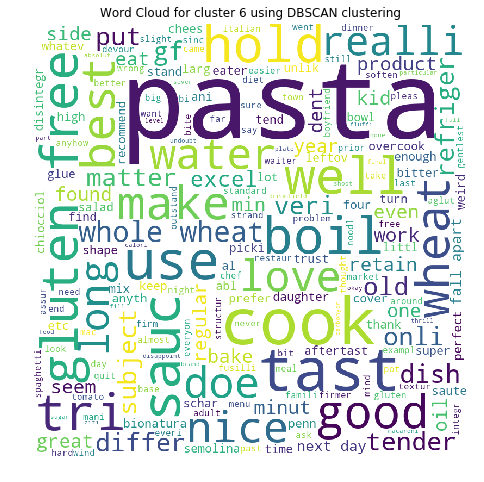

For cluster 7 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


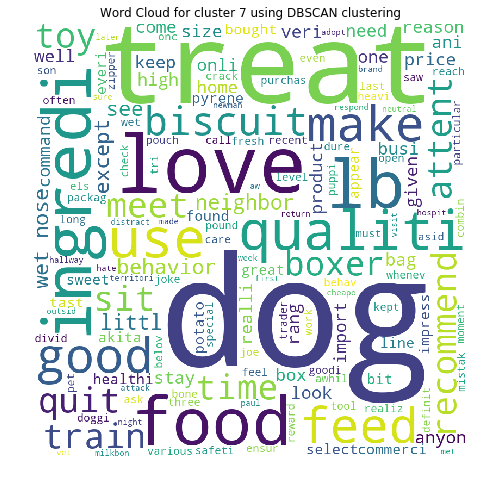

For cluster 8 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


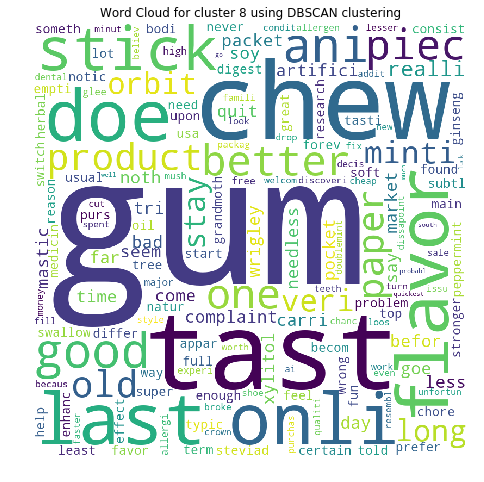

For cluster 9 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


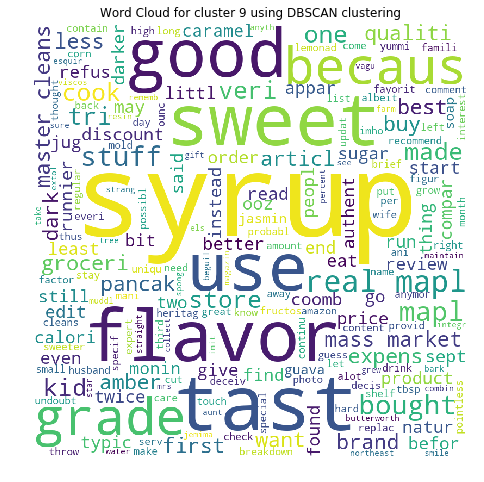

For cluster 10 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


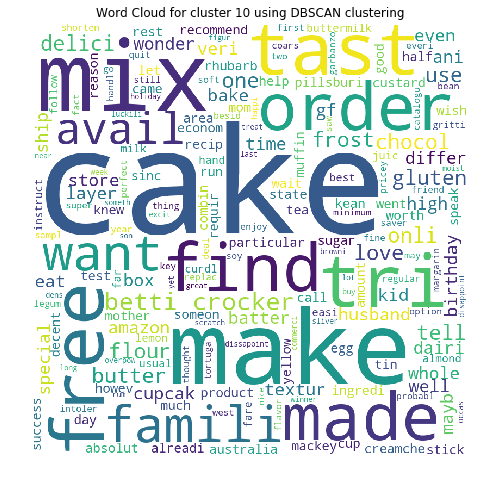

For cluster -1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


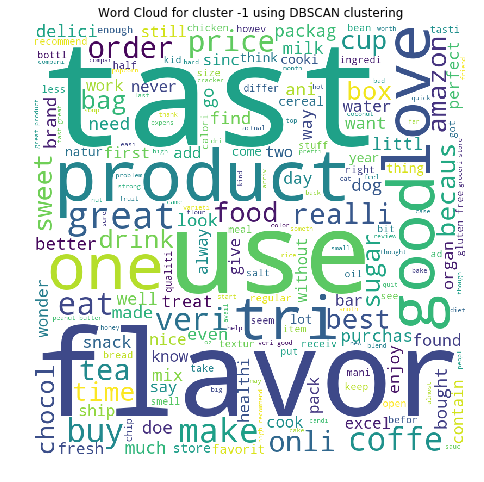

In [157]:
# DBSCAN clustering for eps = 4
classifier(tfidfw2v,4,AmazonReviewDataSampled['Text'])

Clusters obtained using DBSACN for eps = 6 and minimum samples = 5 is  {0, -1}
---------------------------------------------------------------------------------------------------------------------
For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


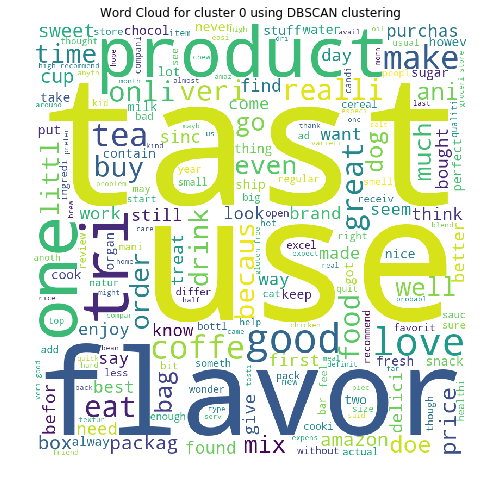

For cluster -1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


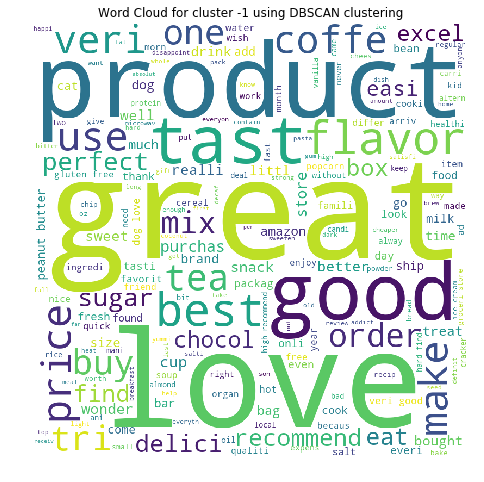

In [158]:
# # DBSCAN clustering for eps = 6
classifier(avgW2V,6,AmazonReviewDataSampled['Text'])

Clusters obtained using DBSACN for eps = 10 and minimum samples = 5 is  {0, -1}
---------------------------------------------------------------------------------------------------------------------
For cluster 0 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


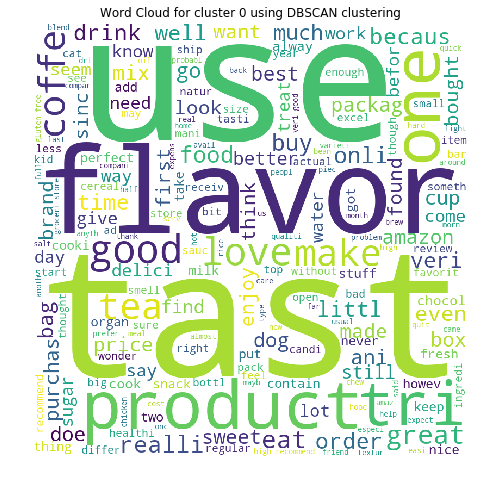

For cluster -1 , the word cloud is as shown below
---------------------------------------------------------------------------------------------------------------------


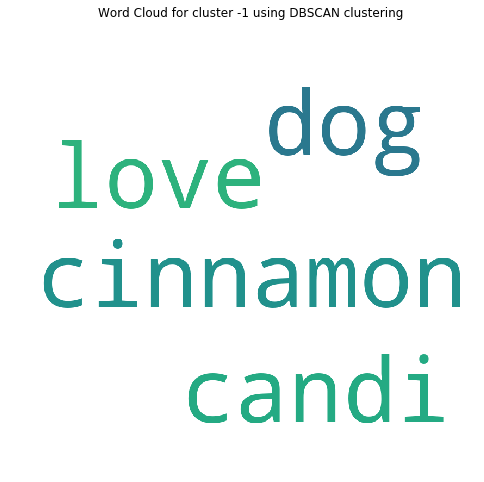

In [159]:
# DBSCAN clustering for eps = 10
classifier(avgW2V,10,AmazonReviewDataSampled['Text'])

# [6] Conclusions

In [12]:
table1 = PrettyTable()
table1.field_names = ['Vectorizer', 'Optimal number of Clusters', 'Inertia']
table1.add_row (['Bag of words', 10, 164581.738])
table1.add_row (['TFIDF',10 ,348688.154])
table1.add_row(  ['AVG W2V',10 ,1700208.056])
table1.add_row( ['TFIDF - W2V',10 ,1618872.597])
table1.title = 'K - means clustering'

In [13]:
print(table1)

+---------------------------------------------------------+
|                   K - means clustering                  |
+--------------+----------------------------+-------------+
|  Vectorizer  | Optimal number of Clusters |   Inertia   |
+--------------+----------------------------+-------------+
| Bag of words |             10             |  164581.738 |
|    TFIDF     |             10             |  348688.154 |
|   AVG W2V    |             10             | 1700208.056 |
| TFIDF - W2V  |             10             | 1618872.597 |
+--------------+----------------------------+-------------+


In [43]:
table2 = PrettyTable()
table2.field_names = ['Vectorizer', 'Number of Clusters', 'Important words per cluster']
table2.add_row(['AVG W2V',2, 'Cluster 0 = fast,use,flavor,product' ])
table2.add_row( ['',"",'Cluster 1 = coffe, flavor, tea,cup'])
table2.add_row(['TFIDF W2V',5,'Cluster 0 = tea,coffe,flavor'])
table2.add_row(['','','Cluster 1 = fast, product,flavor'])
table2.add_row(['','','Cluster 2 = product,one,order,amazon,buy'])
table2.add_row(['','',"Cluster 3 = food,cat,dog,treat"])
table2.add_row(['','',"Cluster 4 = test,use,flavor"])
table2.title = 'Agglomerative  clustering'

In [44]:
print(table2)

+----------------------------------------------------------------------------+
|                         Agglomerative  clustering                          |
+------------+--------------------+------------------------------------------+
| Vectorizer | Number of Clusters |       Important words per cluster        |
+------------+--------------------+------------------------------------------+
|  AVG W2V   |         2          |   Cluster 0 = fast,use,flavor,product    |
|            |                    |    Cluster 1 = coffe, flavor, tea,cup    |
| TFIDF W2V  |         5          |       Cluster 0 = tea,coffe,flavor       |
|            |                    |     Cluster 1 = fast, product,flavor     |
|            |                    | Cluster 2 = product,one,order,amazon,buy |
|            |                    |      Cluster 3 = food,cat,dog,treat      |
|            |                    |       Cluster 4 = test,use,flavor        |
+------------+--------------------+-----------------

In [38]:
table3 = PrettyTable()
table3.field_names = ['Vectorizer', 'EPS', 'Number of Clusters']
table3.add_row(['AVG W2V',4,3])
table3.add_row(['AVG W2V',6,2])
table3.add_row(['AVG W2V',8,2])
table3.add_row(['TFIDF - W2V',4,12])
table3.add_row(['TFIDF - W2V',6,2])
table3.add_row(['TFIDF - W2V',10,2])
table3.title = "DBSCAN Clustering"
print(table3)

+----------------------------------------+
|           DBSCAN Clustering            |
+-------------+-----+--------------------+
|  Vectorizer | EPS | Number of Clusters |
+-------------+-----+--------------------+
|   AVG W2V   |  4  |         3          |
|   AVG W2V   |  6  |         2          |
|   AVG W2V   |  8  |         2          |
| TFIDF - W2V |  4  |         12         |
| TFIDF - W2V |  6  |         2          |
| TFIDF - W2V |  10 |         2          |
+-------------+-----+--------------------+
